In [36]:
import pandas as pd
from glob import glob
import sklearn
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from openTSNE import TSNE

In [14]:
csvs = glob('countries-etc-datapoints/*')
ss =[]
for csv in tqdm(csvs):
    foo = pd.read_csv(csv)
    foo = foo.assign(ident=lambda d : d['geo'] + '-' + d['time'].astype(str)).set_index('ident').iloc[:,2]
    ss.append(foo)


100%|██████████| 549/549 [00:06<00:00, 80.69it/s] 


In [25]:
df_orig = pd.DataFrame(ss).T.fillna(0)
df= df_orig

In [35]:
df=df.select_dtypes(['number'])
scaler = StandardScaler()
scaler.fit(df)
tdf = scaler.transform(df)

In [37]:
embedding = TSNE().fit(tdf)


In [38]:
embedding

TSNEEmbedding([[ 88.83578966,   5.57175624],
               [ 88.83995678,   5.60598422],
               [ 88.73917873,   5.51847291],
               ...,
               [-21.13859187,  73.43915181],
               [-21.13549142,  73.44057398],
               [-44.72091144,  39.29049148]])

In [39]:
import matplotlib.pyplot as plt

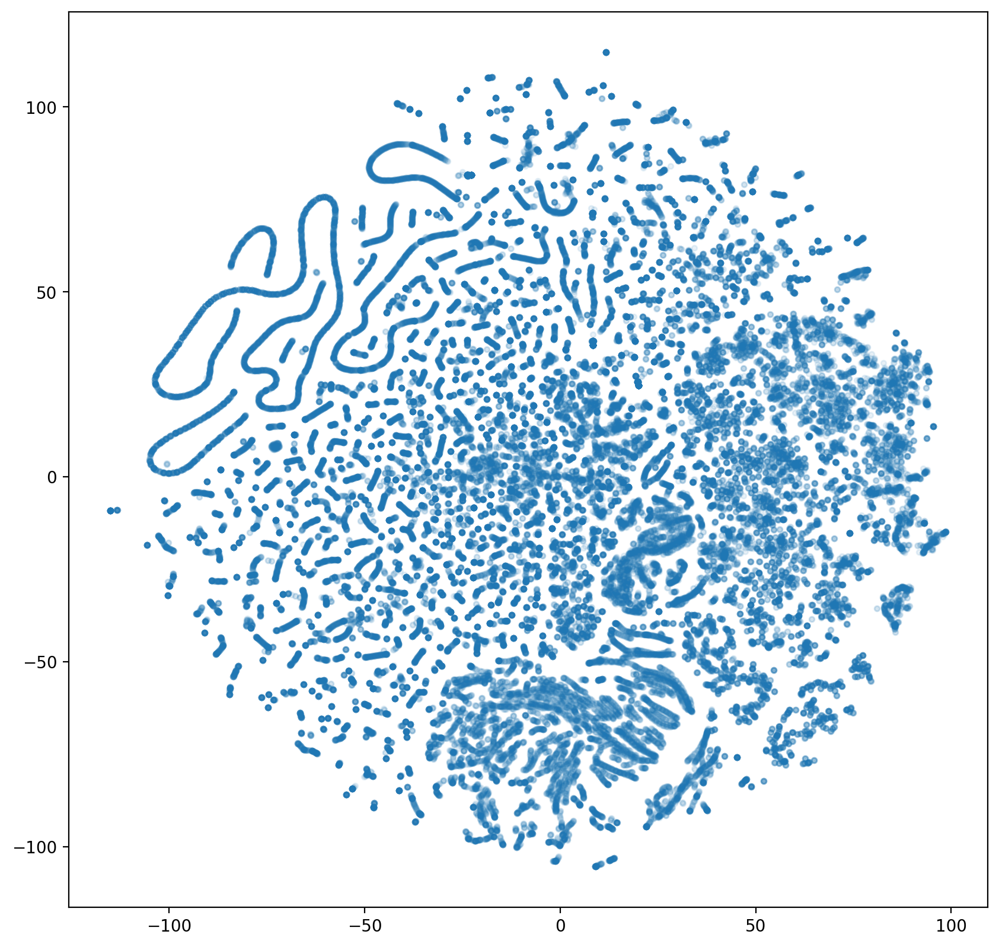

In [53]:
plt.figure(figsize=(10, 10), dpi=100)

plt.scatter(embedding[:,0],embedding[:,1], s = 10, alpha = 0.1)

In [43]:
embedding[:,1].shape

(78738,)

In [ ]:
dist_df = dist_df.reset_index(level=[0,1])


In [83]:
derp =df.index.str.split('-', expand=False)
derp

Index([['afg', '2009'], ['afg', '2010'], ['afg', '2011'], ['ago', '1979'],
       ['ago', '1990'], ['ago', '1991'], ['ago', '1992'], ['ago', '1993'],
       ['ago', '1994'], ['ago', '1995'],
       ...
       ['yug', '1870'], ['zaf', '1600'], ['scg', '2009'], ['scg', '2010'],
       ['scg', '2011'], ['scg', '2012'], ['scg', '2013'], ['scg', '2014'],
       ['scg', '2015'], ['jey', '2016']],
      dtype='object', length=78738)

In [108]:
years=[]
geo = []
for item in derp: 
    years.append(int(item[1]))
    geo.append(item[0])


In [109]:
ycts = pd.DataFrame([years,geo]).T
ycts.columns=['year','geo']
ycts

,year,geo
0,2009,afg
1,2010,afg
2,2011,afg
3,1979,ago
4,1990,ago
...,...,...
78733,2012,scg
78734,2013,scg
78735,2014,scg
78736,2015,scg


In [126]:
!wget https://gist.githubusercontent.com/tadast/8827699/raw/f5cac3d42d16b78348610fc4ec301e9234f82821/countries_codes_and_coordinates.csv

--2020-12-20 04:04:58--  https://gist.githubusercontent.com/tadast/8827699/raw/f5cac3d42d16b78348610fc4ec301e9234f82821/countries_codes_and_coordinates.csv
Resolving gist.githubusercontent.com (gist.githubusercontent.com)... 151.101.176.133
Connecting to gist.githubusercontent.com (gist.githubusercontent.com)|151.101.176.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12720 (12K) [text/plain]
Saving to: ‘countries_codes_and_coordinates.csv’

countries_codes_and 100%[===================>]  12.42K  --.-KB/s    in 0.002s  

2020-12-20 04:04:59 (6.58 MB/s) - ‘countries_codes_and_coordinates.csv’ saved [12720/12720]



In [165]:
geocodes = pd.read_csv('https://raw.githubusercontent.com/lukes/ISO-3166-Countries-with-Regional-Codes/master/all/all.csv',
                      )
geocodes

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
244,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,Oceania,Polynesia,NaN,9.0,61.0,NaN
245,Western Sahara,EH,ESH,732,ISO 3166-2:EH,Africa,Northern Africa,NaN,2.0,15.0,NaN
246,Yemen,YE,YEM,887,ISO 3166-2:YE,Asia,Western Asia,NaN,142.0,145.0,NaN
247,Zambia,ZM,ZMB,894,ISO 3166-2:ZM,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0


In [166]:
geocodes['alpha-3'] = geocodes['alpha-3'].str.replace('"','')
geocodes

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
244,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,Oceania,Polynesia,NaN,9.0,61.0,NaN
245,Western Sahara,EH,ESH,732,ISO 3166-2:EH,Africa,Northern Africa,NaN,2.0,15.0,NaN
246,Yemen,YE,YEM,887,ISO 3166-2:YE,Asia,Western Asia,NaN,142.0,145.0,NaN
247,Zambia,ZM,ZMB,894,ISO 3166-2:ZM,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0


In [167]:
geocodes.index = geocodes['alpha-3'].str.lower()

In [168]:
geocodes

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
alpha-3,,,,,,,,,,,
afg,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
ala,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
alb,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
dza,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
asm,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
wlf,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,Oceania,Polynesia,NaN,9.0,61.0,NaN
esh,Western Sahara,EH,ESH,732,ISO 3166-2:EH,Africa,Northern Africa,NaN,2.0,15.0,NaN
yem,Yemen,YE,YEM,887,ISO 3166-2:YE,Asia,Western Asia,NaN,142.0,145.0,NaN


In [169]:
ycts.columns=['year','geo']

In [170]:
ycts.geo.map(geocodes['name'])

0        Afghanistan
1        Afghanistan
2        Afghanistan
3             Angola
4             Angola
            ...     
78733            NaN
78734            NaN
78735            NaN
78736            NaN
78737         Jersey
Name: geo, Length: 78738, dtype: object

In [173]:
ycts['country']=ycts.geo.map(geocodes['name'])
yc = ycts.copy()

In [174]:
yc

,year,geo,country
0,2009,afg,Afghanistan
1,2010,afg,Afghanistan
2,2011,afg,Afghanistan
3,1979,ago,Angola
4,1990,ago,Angola
...,...,...,...
78733,2012,scg,NaN
78734,2013,scg,NaN
78735,2014,scg,NaN
78736,2015,scg,NaN


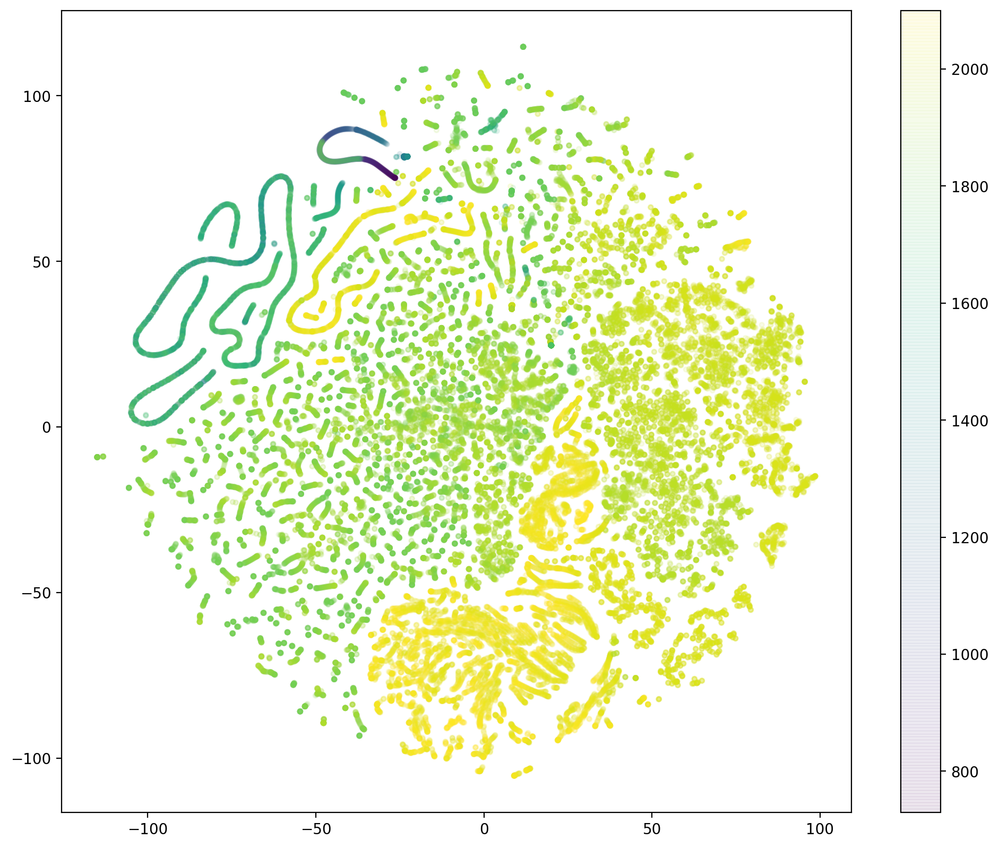

In [180]:
plt.figure(figsize=(12, 10), dpi=100)

sc = plt.scatter(embedding[:,0],embedding[:,1], s = 10, alpha = 0.1, c = yc.year)
plt.colorbar(sc)

In [185]:
mcolors.BASE_COLORS

{'b': (0, 0, 1),
 'g': (0, 0.5, 0),
 'r': (1, 0, 0),
 'c': (0, 0.75, 0.75),
 'm': (0.75, 0, 0.75),
 'y': (0.75, 0.75, 0),
 'k': (0, 0, 0),
 'w': (1, 1, 1)}

In [186]:
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors


colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
# Sort colors by hue, saturation, value and name.
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

In [188]:
len(sorted_names)

156

In [196]:
cs = sorted_names + sorted_names
cs= cs[:265]

['black']

In [199]:
cs = sorted_names + sorted_names
cs= cs[:249]
geocodes['color']=cs

In [200]:
yc['color']=yc.geo.map(geocodes.color)

In [204]:
yc = yc.fillna('white')

In [205]:
yc

,year,geo,country,color
0,2009,afg,Afghanistan,black
1,2010,afg,Afghanistan,black
2,2011,afg,Afghanistan,black
3,1979,ago,Angola,darkgray
4,1990,ago,Angola,darkgray
...,...,...,...,...
78733,2012,scg,white,white
78734,2013,scg,white,white
78735,2014,scg,white,white
78736,2015,scg,white,white


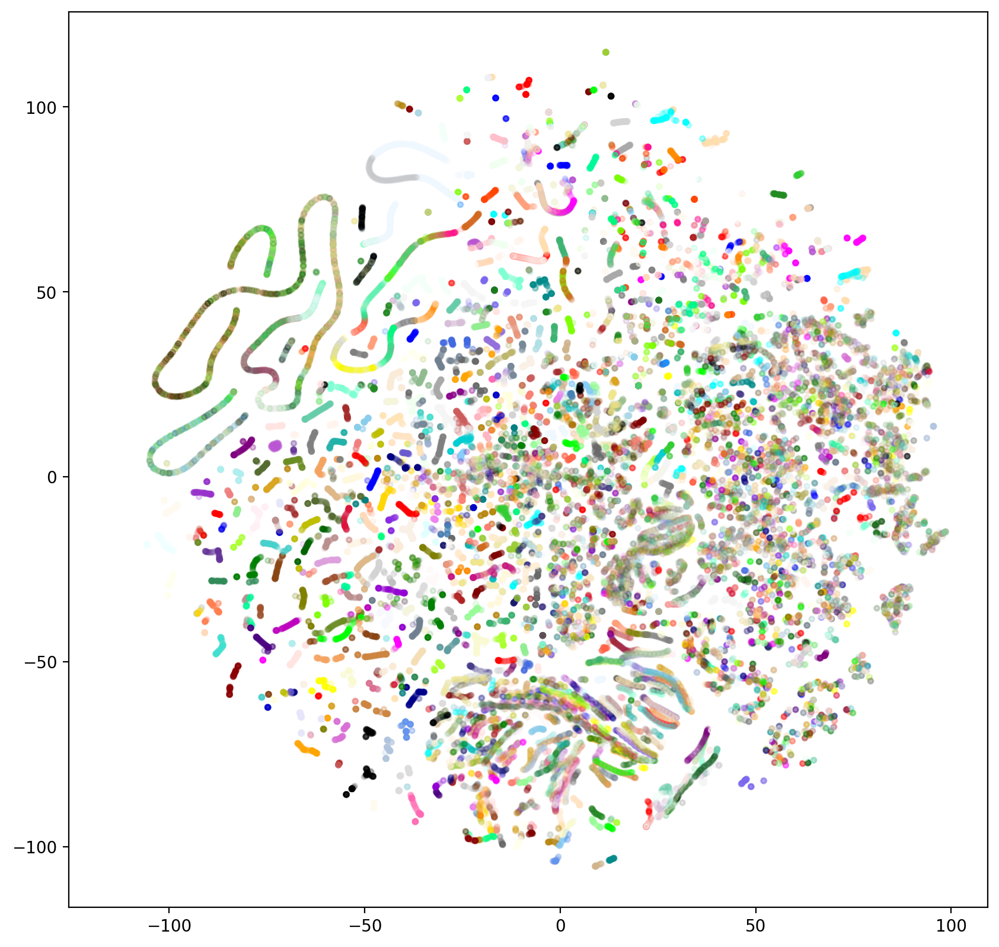

In [208]:
plt.figure(figsize=(10, 10), dpi=100)

sc = plt.scatter(embedding[:,0],embedding[:,1], s = 10, alpha = 0.1, c = yc.color)


In [211]:
yc['tsne0']=embedding[:,0]
yc['tsne1']=embedding[:,1]

In [216]:
yc['yearcountry'] = yc['year'].astype(str) + ' ' + yc['country']

In [218]:
import plotly.express as px

df_2007 = px.data.gapminder().query("year==2007")

fig = px.scatter(yc, x="tsne0", y="tsne1",
                 hover_name="yearcountry",
                template='plotly_white')

fig.show()
fig.write_html("woooow.html")
